In [2]:
%reload_ext autoreload
%autoreload 2

import os
import sys
import time

from utilities2015 import *

from scipy.spatial.distance import cdist
from scipy.cluster.hierarchy import average, fcluster, single, complete

from joblib import Parallel, delayed

from skimage.color import gray2rgb
from skimage.measure import find_contours
from skimage.util import img_as_float

import matplotlib.pyplot as plt
%matplotlib inline

from networkx import from_dict_of_lists, Graph, adjacency_matrix, connected_components
from networkx.algorithms import node_connected_component, dfs_successors, dfs_postorder_nodes

In [20]:
stack_name = 'MD593'
# dm = DataManager(stack=stack_name, section=section_id, segm_params_id='gridsize200')
dms = dict([(section_id, DataManager(stack=stack_name, section=section_id, segm_params_id='tSLIC200')) 
       for section_id in [138, 139, 140]])

In [29]:
for dm in dms.itervalues():
    dm.load_multiple_results(results=['texHist', 'segmentation', 'texMap', 'neighbors', 
                                  'edgeCoords', 'spCentroids', 'edgeNeighbors', 'dedgeNeighbors',
                                  'spCoords'])

In [30]:
def choose_seeds(seed1, sec, dms):
    
    dm1 = dms[sec]
    seeds = {}
    seeds[sec] = seed1
    
    for s, dm in dms.iteritems():
        if s == sec: continue
        candidate_sps = np.where((dm.sp_centroids[:,0] > dm1.sp_centroids[seed1, 0] - 200) & \
            (dm.sp_centroids[:,0] < dm1.sp_centroids[seed1, 0] + 200) & \
            (dm.sp_centroids[:,1] > dm1.sp_centroids[seed1, 1] - 200) & \
            (dm.sp_centroids[:,1] < dm1.sp_centroids[seed1, 1] + 200))[0]

        c = candidate_sps[np.argsort(chi2s([dm1.texton_hists[seed1]], dm.texton_hists[candidate_sps]))][0]
        seeds[s] = c
        
    return seeds

In [84]:
seeds = choose_seeds(948, 139, dms)
print seeds

{138: 920, 139: 948, 140: 946}


In [19]:
from networkx import from_dict_of_lists, Graph, adjacency_matrix, connected_components
from itertools import chain
from skimage.feature import peak_local_max
from scipy.spatial import ConvexHull
from matplotlib.path import Path

In [32]:
from collections import defaultdict

In [38]:
num_sp_percentage_limit = .1

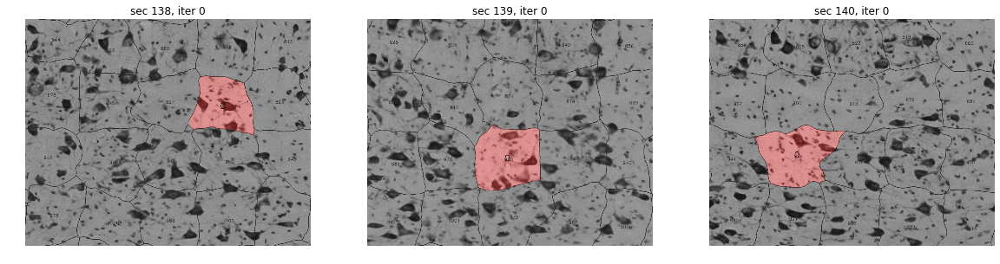

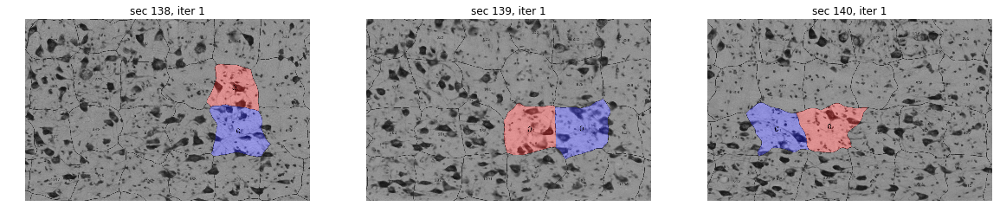

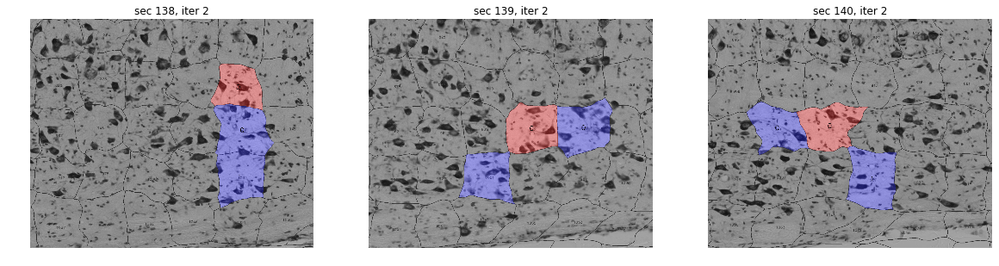

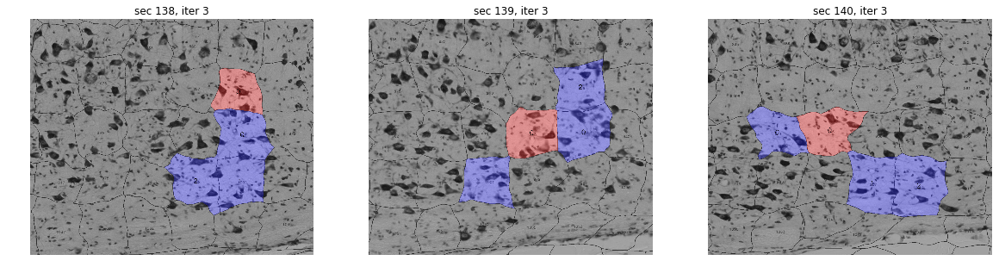

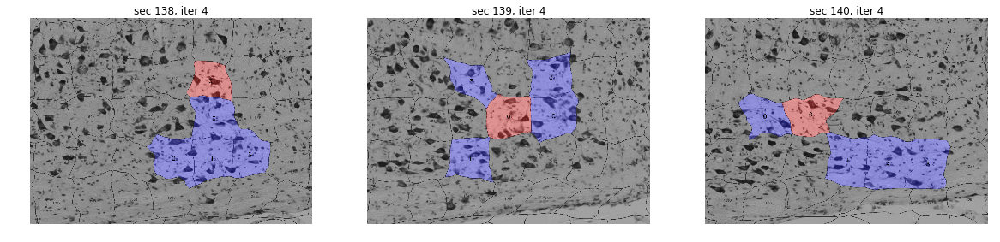

...

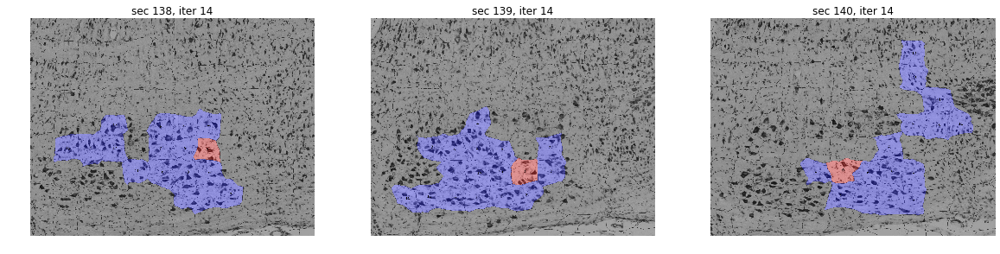

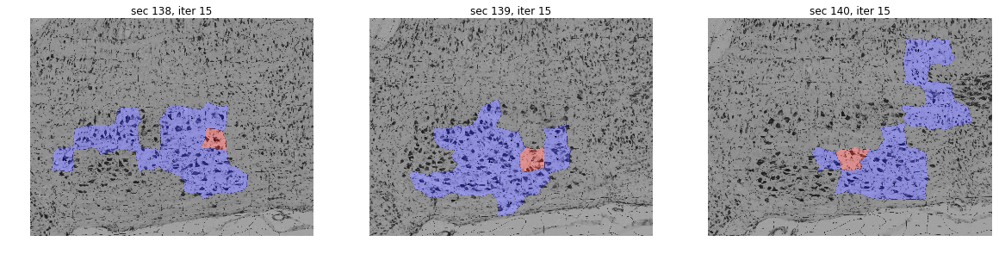

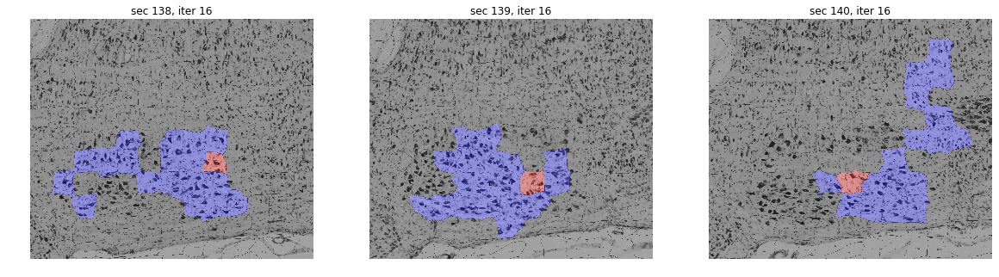

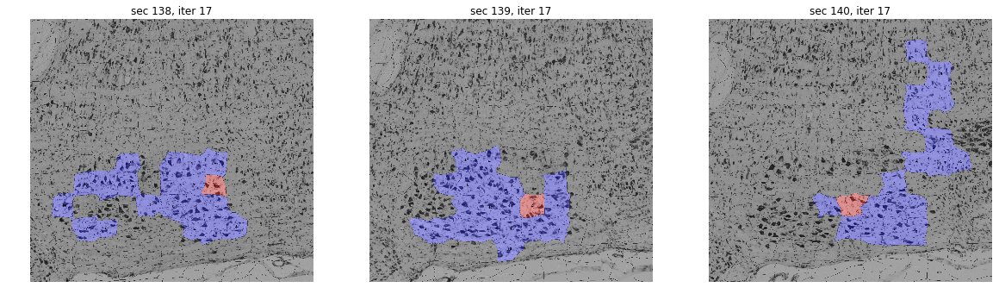

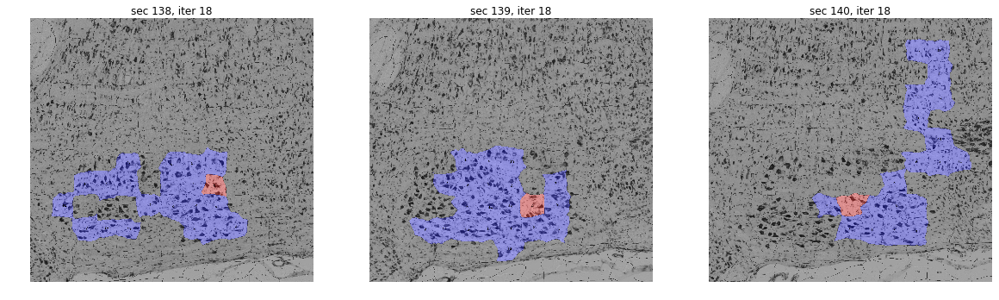

KeyboardInterrupt: 

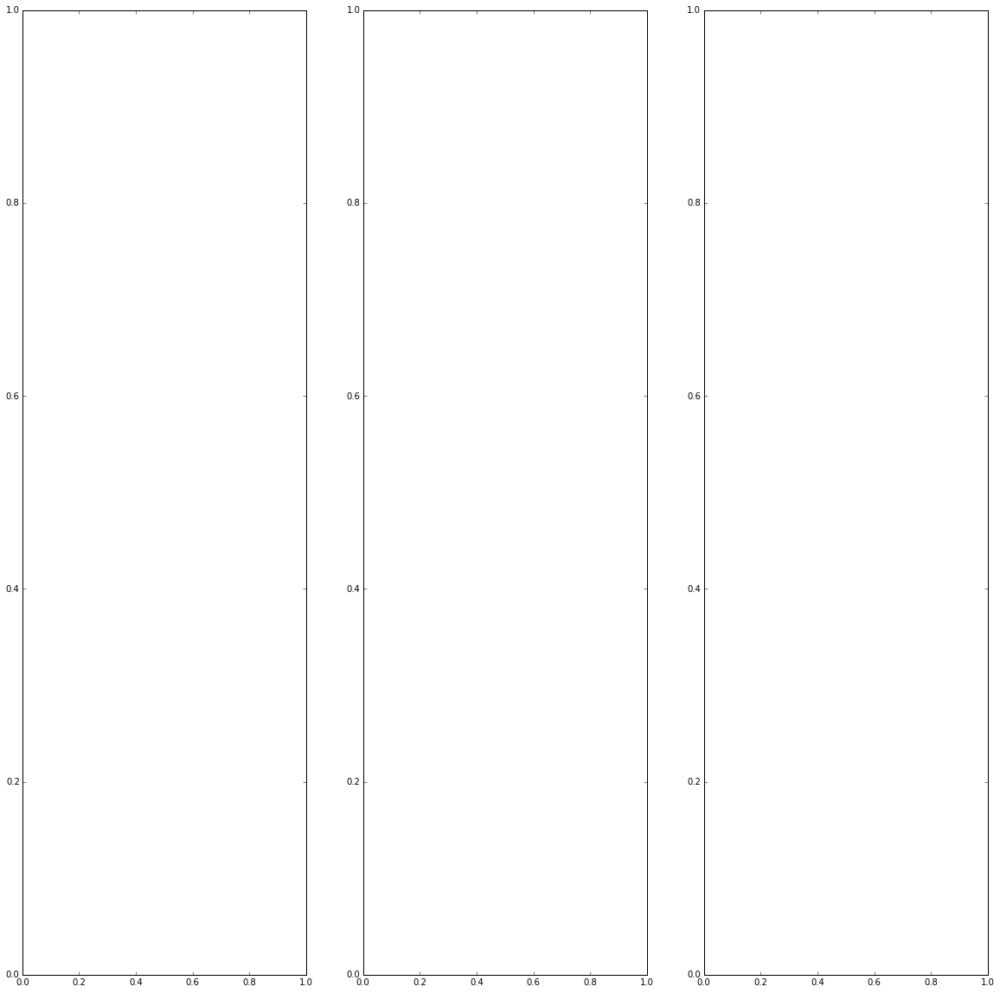

In [91]:
curr_cluster = defaultdict(set)
added_sps = defaultdict(list)

iter_ind = 0

candidate_scores = {}
candidate_sps = {}

for sec, dm in dms.iteritems():
    candidate_scores[sec] = [0]
    candidate_sps[sec] = [seeds[sec]]

while len(candidate_sps[138]) > 0:
    
    if iter_ind == 20:
        break

    for sec, dm in dms.iteritems():
        best_ind = np.argmax(candidate_scores[sec])

        sp = candidate_sps[sec][best_ind]
        del candidate_sps[sec][best_ind]

        curr_cluster[sec].add(sp)
        added_sps[sec].append(sp)

        extra_sps = []
        sg = dm.neighbor_long_graph.subgraph(list(set(range(dm.n_superpixels)) - curr_cluster[sec]))
        for c in connected_components(sg):
            if len(c) < 10: # holes
                extra_sps.append(c)
        extra_sps = list(chain(*extra_sps))
        curr_cluster[sec] |= set(extra_sps)
        added_sps[sec] += extra_sps
        
        candidate_sps[sec] = (set(candidate_sps[sec]) | \
                 (set.union(*[dm.neighbors_long[i] for i in list(extra_sps)+[sp]]) - {-1})) - curr_cluster[sec]
        candidate_sps[sec] = list(candidate_sps[sec])

#         candidate_seed_dists = []
        candidate_scores[sec] = []
        for c in candidate_sps[sec]:
#             int_neighbors = list(set(curr_cluster[sec]) & dm.neighbors[c])
#             int_dist = chi2(self.texton_hists[c], self.texton_hists[int_neighbors + [c]].mean(axis=0))
#             curr_dist = chi2(dm.texton_hists[c], dm.texton_hists[list(curr_cluster[sec])+[c]].mean(axis=0))
            curr_dist = chi2(dm.texton_hists[c], 
                             dm.texton_hists[list(set.union(*[curr_cluster[s] for s in dms.iterkeys()]))+[c]].mean(axis=0))
            seed_dist = chi2(dm.texton_hists[c], dm.texton_hists[seeds[sec]])
#             sc = .1 * int_dist + .3* curr_dist + .6*seed_dist
            sc = .5*curr_dist + .5*seed_dist
#             candidate_seed_dists.append(seed_dist)
            candidate_scores[sec].append(-sc)
        
    if len(curr_cluster) > int(dms[138].n_superpixels * num_sp_percentage_limit):
        break
    
    visualize_clusters_in_subplot_diff_sections(dms, added_sps, 
#                             candidates=[map(itemgetter(1), sorted(zip(candidate_scores[sec], candidate_sps[sec]), reverse=True))
#                                         for sec in dms.iterkeys()],
                            titles=['sec %d, iter %d'%(sec, iter_ind) 
                                    for sec in dms.iterkeys()])

    iter_ind += 1

In [89]:
def visualize_clusters_in_subplot_diff_sections(dms, clusters, candidates=None, ncol=3, margin=300, titles=None):
    
    n_cls = len(dms)
    ncol = min(ncol, n_cls)

    xmin = np.inf
    ymin = np.inf
    xmax = 0
    ymax = 0
    
    for sec, cl in clusters.iteritems():
        centroids = dms[sec].sp_centroids[list(cl), ::-1]
        xmin = min(xmin, centroids[:,0].min(axis=0))
        xmax = max(xmax, centroids[:,0].max(axis=0))
        ymin = min(ymin, centroids[:,1].min(axis=0))
        ymax = max(ymax, centroids[:,1].max(axis=0))

    xmin = int(max(0, xmin - margin))
    ymin = int(max(0, ymin - margin))
    xmax = int(min(dms[138].image_width, xmax + margin))
    ymax = int(min(dms[138].image_height, ymax + margin))

    fig, axes = plt.subplots(int((n_cls-1)/ncol)+1, ncol, figsize=(20,20), squeeze=False)

    for ci, (sec, cl) in enumerate(clusters.iteritems()):
#         viz = dms[sec].visualize_clusters(cl, highlight_seed=True, seq_text=True,
#                                    ymin=ymin, xmin=xmin, ymax=ymax, xmax=xmax)
        if candidates is not None:
            viz = dms[sec].visualize_multiple_clusters([[cl[0]], cl[1:], candidates[ci]], 
                                                   ymin=ymin, xmin=xmin, ymax=ymax, xmax=xmax, 
                                                   show_cluster_indices=True)
        else:
            viz = dms[sec].visualize_multiple_clusters([[cl[0]], cl[1:]], 
                                                   ymin=ymin, xmin=xmin, ymax=ymax, xmax=xmax, 
                                                   show_cluster_indices=True)
        
        ax = axes[ci/ncol, ci%ncol]
        ax.imshow(viz)
        ax.axis('off')
        if titles is not None:
            ax.set_title(titles[ci])

    plt.show()

In [ ]:
def compute_cluster_score(self, cluster, seed=None, seed_weight=0, verbose=False, method='rc-mean', thresh=.2):

    cluster_list = list(cluster)
    cluster_avg = self.texton_hists[cluster_list].mean(axis=0)

    surrounds = set([i for i in set.union(*[self.neighbors[c] for c in cluster]) if i not in cluster and i != -1])

    if len(surrounds) == 0: # single sp on background
        return np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan

    surrounds_list = list(surrounds)

    # if verbose:
    #     print 'min', surrounds_list[ds.argmin()]

    ds = np.atleast_1d(np.squeeze(chi2s([cluster_avg], self.texton_hists[surrounds_list])))

    if method == 'min':
        surround_dist = ds.min()
        if verbose:
            print 'min', surrounds_list[ds.argmin()]
        score = surround_dist

    elif method == 'mean':
        surround_dist = ds.mean()
        score = surround_dist

    elif method == 'percentage':
        surround_dist = np.count_nonzero(ds > thresh) / float(len(ds)) # hard
        score = surround_dist

    elif method == 'percentage-soft':        
        sigma = .01
        surround_dist = np.sum(1./(1+np.exp((thresh - ds)/sigma)))/len(ds); #soft        
        if verbose:
            for t in sorted(zip(surrounds_list, ds), key=itemgetter(1)):
                print t
            plt.hist(ds, bins=np.linspace(0,1,50));
            plt.show();

        score = surround_dist

    elif method == 'rc-min' or method == 'rc-mean':

        sigs_front = []
        if len(cluster) > 1:

            # frontiers = set.union(*[set(self.neighbors[s]) for s in surrounds_list]) & set(cluster_list)
            frontiers = cluster
            for f in frontiers:
                if len(surrounds & set(self.neighbors[f])) > 0:
                    alternative_sps = list((surrounds & set(self.neighbors[f])) - {-1})
                else:
                    q = list(surrounds-{-1})
                    alternative_sps = [q[np.squeeze(cdist([self.sp_centroids[f]], self.sp_centroids[q])).argmin()]]

                # alternative_dist = np.atleast_1d(np.squeeze(chi2s([self.texton_hists[f]], 
                #                                 self.texton_hists[alternative_sps+[f]].mean(axis=0)))).min()
                # alternative_dist = np.min([chi2(self.texton_hists[f], self.texton_hists[[s,f]].mean(axis=0)) for s in alternative_sps])
                alternative_dist = np.mean([chi2(self.texton_hists[f], self.texton_hists[[s,f]].mean(axis=0)) for s in alternative_sps])

                # interior_neighbors = list((set(cluster_list) & set(self.neighbors[f])) - {-1})
                # interior_avg = self.texton_hists[interior_neighbors + [f]].mean(axis=0)
                # curr_dist = .5 * chi2(self.texton_hists[f], interior_avg) + .5 * chi2(self.texton_hists[f], cluster_avg)

                if seed is not None:
                    curr_dist = chi2(self.texton_hists[f], seed_weight*self.texton_hists[seed]+(1.-seed_weight)*self.texton_hists[cluster_list].mean(axis=0))                        
                else:
                    curr_dist = chi2(self.texton_hists[f], self.texton_hists[cluster_list].mean(axis=0))

                sig = alternative_dist - curr_dist
                sigs_front.append(sig)

            if verbose:
                print 'frontiers advantages'
                print zip(list(frontiers), sigs_front)

        sigs_sur = []
        for s in surrounds:
            sur_neighbors = self.neighbors[s] - set(cluster)
            alternative_dist = np.mean([chi2(self.texton_hists[s], self.texton_hists[[s,n]].mean(axis=0)) for n in sur_neighbors])

            if seed is not None:
                curr_dist = chi2(self.texton_hists[s], seed_weight*self.texton_hists[seed]+(1.-seed_weight)*self.texton_hists[cluster_list+[s]].mean(axis=0))
            else:
                curr_dist = chi2(self.texton_hists[s], self.texton_hists[cluster_list+[s]].mean(axis=0))

            sig = curr_dist - alternative_dist
            sigs_sur.append(sig)

        if verbose:
            print 'surround advantages'
            print zip(list(surrounds), sigs_sur)

        # sigs_sur = np.array(sigs_sur)
        # sigs_front = np.array(sigs_front)

        # thresh = .2
        # # sig = int(sig > thresh)
        # sigma = .025
        # sigs = 1./(1+np.exp((thresh - sigs)/sigma)); #soft

        if method == 'rc-min':
            if len(sigs_front) > 0:
                score = min(np.min(sigs_sur), np.min(sigs_front))
                s1_max = np.max(sigs_sur)
                s1_min = np.min(sigs_sur)
                s2_max = np.max(sigs_front)
                s2_min = np.min(sigs_front)
            else:
                score = np.min(sigs_sur)
                s1_max = np.max(sigs_sur)
                s1_min = np.min(sigs_sur)
                s2_max = np.nan
                s2_min = np.nan

            # score = .5*np.min(sigs_sur)+.5*np.min(sigs_front) if len(sigs_front) > 0 else 0                
        elif method == 'rc-mean':
            if len(sigs_front) > 0:
                # print np.mean(sigs_sur), np.mean(sigs_front)
                score = .5*np.mean(sigs_sur)+.5*np.mean(sigs_front)
                # score = max(np.mean(sigs_sur), np.mean(sigs_front))
                s1_max = np.max(sigs_sur)
                s1_min = np.min(sigs_sur)
                s2_max = np.max(sigs_front)
                s2_min = np.min(sigs_front)
            else:
                score = np.mean(sigs_sur)
                s1_max = np.max(sigs_sur)
                s1_min = np.min(sigs_sur)
                s2_max = np.nan
                s2_min = np.nan

    else:
        raise 'unrecognized method'
            # print list(frontiers)[np.argmin(sigs)]


    inter_sp_dists = np.squeeze(pdist(self.texton_hists[list(cluster)], chi2))
    inter_sp_dist = inter_sp_dists.mean()

    if seed is not None:
        seed_dist = chi2(cluster_avg, self.texton_hists[seed])
    else:
        seed_dist = np.nan

    if method == 'rc-min' or method == 'rc-mean':
        return score,  np.mean(sigs_sur),  np.mean(sigs_front), inter_sp_dist, seed_dist, s1_max, s1_min, s2_max, s2_min
    else:
        return score,  np.nan, np.nan, inter_sp_dist, seed_dist, np.nan, np.nan, np.nan, np.nan